# Import necessary libraries

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import qnorm
import numpy as np
from scipy.stats import variation
from scipy.stats import zscore
from sklearn import preprocessing

# Open the data

In [2]:
file_path = '/Volumes/TOSHIBA EXT/4t curs/Advanced Bioinformatics/Project/Python/log2expressiondata.csv'
df = pd.read_csv(file_path, index_col = 0)
df.head(5)

,77322072-2a7f-49e6-a9d1-c521c25acd70.rna_seq.augmented_star_gene_counts.tsv,6f6bf240-1ca4-47d0-9a77-17b0ce9b8ae7.rna_seq.augmented_star_gene_counts.tsv,59e8b7b7-5183-4655-aa5e-e4b5ba73eded.rna_seq.augmented_star_gene_counts.tsv,5418228b-cfd0-4580-87c6-3ebf6282ad73.rna_seq.augmented_star_gene_counts.tsv,c7fd0bf8-753e-45d6-b987-51ec7559f728.rna_seq.augmented_star_gene_counts.tsv,50c308c9-922a-4083-ae09-e5e4d8c437af.rna_seq.augmented_star_gene_counts.tsv,55071ef3-bf09-43a2-a54c-a9ec61a84615.rna_seq.augmented_star_gene_counts.tsv,7d9c7c34-76e0-4622-b5f7-60e12f6d4e07.rna_seq.augmented_star_gene_counts.tsv,32675d71-6f79-4b8f-ab7c-e2350b15875c.rna_seq.augmented_star_gene_counts.tsv,3d11905a-16eb-40b2-a36b-e37dca6359d3.rna_seq.augmented_star_gene_counts.tsv,...,4c87674d-dd05-490d-a584-84490509f4d4.rna_seq.augmented_star_gene_counts.tsv,5cfb768f-7b49-4a72-92c9-d7502f5ba5b8.rna_seq.augmented_star_gene_counts.tsv,03ef99c7-55b7-4770-9eac-2ee007aa78ca.rna_seq.augmented_star_gene_counts.tsv,3ab1dfbc-ab83-446e-b680-cd6aec12b177.rna_seq.augmented_star_gene_counts.tsv,029a2c3e-0fd1-4cb4-9021-3947d28ca28d.rna_seq.augmented_star_gene_counts.tsv,ed41fe8b-fe2e-4bf3-91e3-2cf50ddcbc78.rna_seq.augmented_star_gene_counts.tsv,b9a5766c-e155-423e-a075-10fb14fe87df.rna_seq.augmented_star_gene_counts.tsv,a462c0f9-23d3-428b-9b61-e42cb6a68af1.rna_seq.augmented_star_gene_counts.tsv,0d3cfbc0-4420-48ed-a459-2e18d2ece5b6.rna_seq.augmented_star_gene_counts.tsv,d43517e2-e447-42cc-93e1-cbc9669ef4f1.rna_seq.augmented_star_gene_counts.tsv
gene_id,,,,,,,,,,,,,,,,,,,,,
ENSG00000000003.15,5.853883,6.242844,5.877366,5.554976,3.746270,5.778416,6.605066,6.116313,5.103242,5.100397,...,5.004560,5.073456,5.734804,5.092191,5.545338,5.857862,5.716747,5.352275,5.517622,3.911040
ENSG00000000005.6,0.000000,0.222557,0.000000,0.000000,0.107688,0.088956,0.000000,0.000000,0.000000,1.341758,...,0.000000,0.000000,0.035061,0.055335,0.065021,0.000000,0.000000,0.000000,0.000000,0.000000
ENSG00000000419.13,6.474339,6.794343,7.083010,7.648951,5.943865,5.608244,6.771603,6.813068,5.584301,6.713725,...,6.198396,6.507392,6.843400,6.794808,6.137436,6.854949,6.647530,6.690696,7.539495,6.633021
ENSG00000000457.14,3.294180,3.387142,3.666132,4.221467,2.147893,2.470016,4.229765,3.583724,2.693632,4.618344,...,2.987357,2.368098,3.344133,3.016461,2.465060,3.315856,2.725916,2.816661,2.570171,2.630732
ENSG00000000460.17,2.783813,2.667915,2.528596,2.275037,1.197425,1.931305,4.033529,3.424828,1.687509,4.613820,...,3.734807,2.546240,3.385155,2.828977,1.683876,3.925373,2.505129,2.827535,3.220438,2.804818


# Quantile normalization

To normalize the data we will use quantile normalization technique. Thus makes two distributions identical in statistical properties. 

In [3]:
qnorm_df = qnorm.quantile_normalize(df, axis=1)

# Graphic representations before and after normalization

## Boxplots

To visualize the distribution of our data, and see how it changes before and after the quantile normalization, we will plot 3 sets of 20 random samples around the data in boxplots and in density plots. 

In the plots, it is appreciable that the data has been normalized, having an homogeneous distribution of expression values around all the plotted samples.

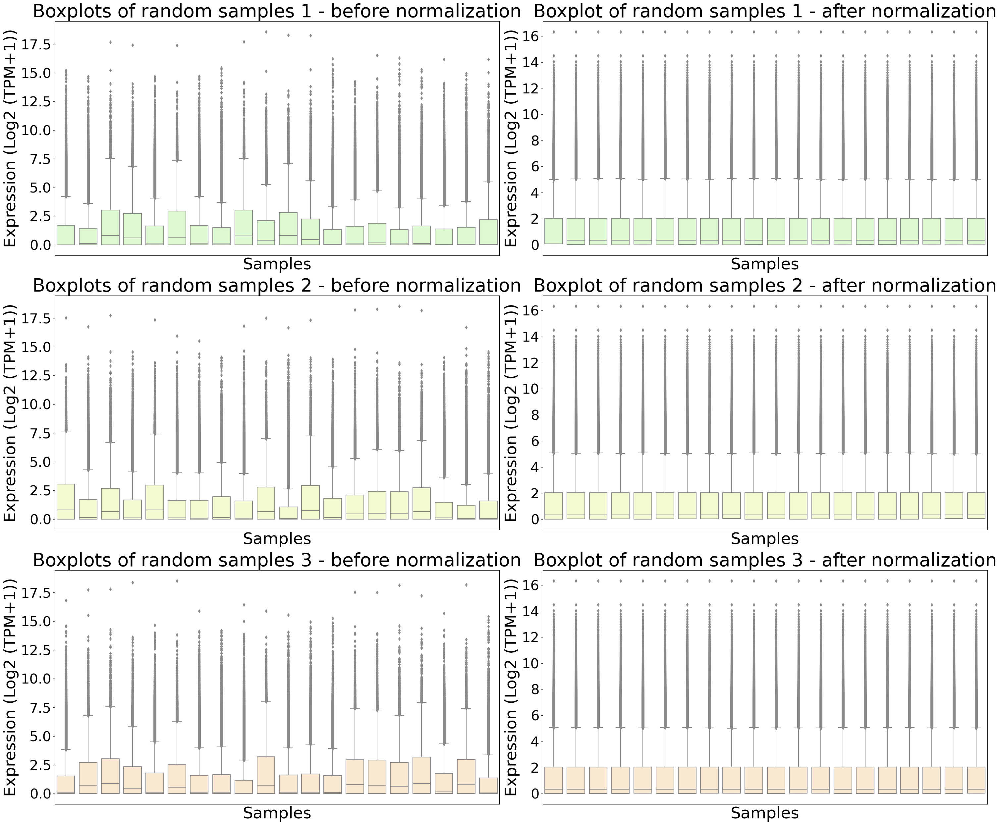

In [4]:
plt.figure(figsize = (30, 25))
random_columns_sets = [np.random.choice(qnorm_df.columns, 20, replace = False) for _ in range(3)]
colors = ['#DCFFCC', '#FAFFCC', '#FFE9CC']

for i, selected_columns in enumerate(random_columns_sets):
    col = colors[i]
    plt.subplot(3, 2, 2 * i + 1)  
    random_df = df[selected_columns]
    sns.boxplot(random_df, color = col)
    plt.title(f'Boxplots of random samples {i + 1} - before normalization', fontsize = 40)
    plt.ylabel('Expression (Log2 (TPM+1))', fontsize = 35)
    plt.xlabel('Samples', fontsize = 35)
    plt.yticks(fontsize = 30) 
    plt.xticks([]) 
    
    plt.subplot(3, 2, 2 * i + 2)  
    random_norm_df = qnorm_df[selected_columns]
    sns.boxplot(random_norm_df, color = col)
    plt.title(f'Boxplot of random samples {i + 1} - after normalization', fontsize = 40)
    plt.ylabel('Expression (Log2 (TPM+1))', fontsize = 35)
    plt.xlabel('Samples', fontsize = 35)
    plt.yticks(fontsize = 30) 
    plt.xticks([]) 
plt.tight_layout()

plt.savefig('/Volumes/TOSHIBA EXT/4t curs/Advanced Bioinformatics/Project/Python/Graphs/boxplot_ba_norm.png')

## Density plots

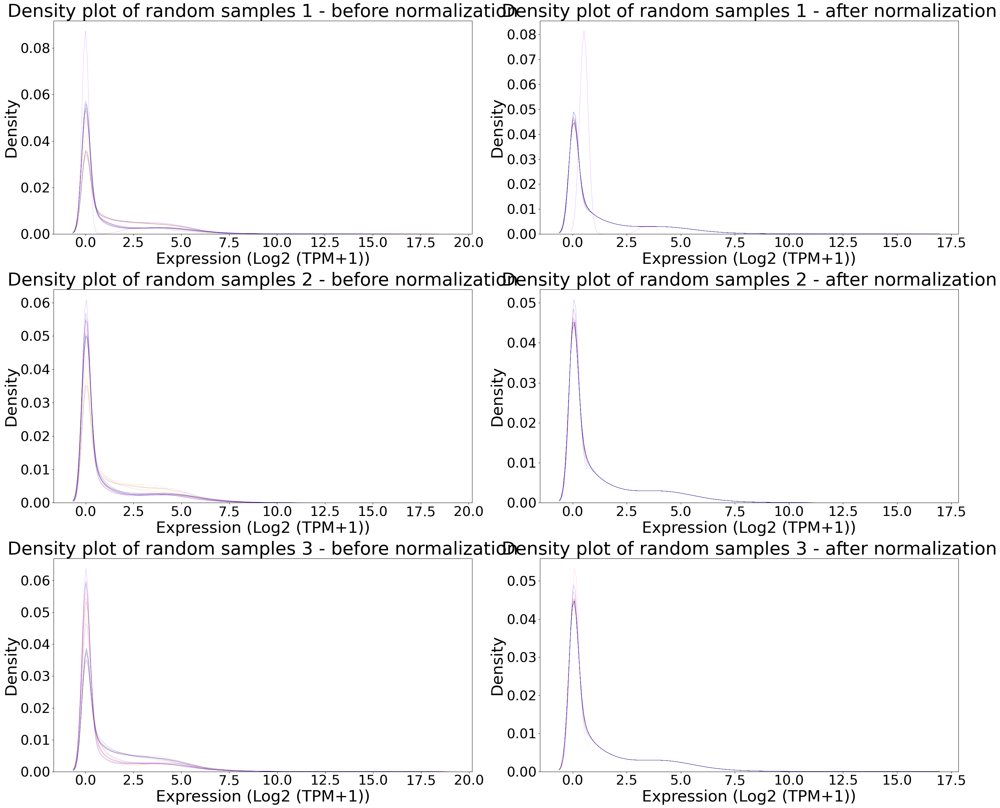

In [5]:
plt.figure(figsize = (30, 25))
random_columns_sets = [np.random.choice(qnorm_df.columns, 20, replace = False) for _ in range(3)]

for i, selected_columns in enumerate(random_columns_sets):
    plt.subplot(3, 2, 2 * i + 1)  
    random_df = df[selected_columns]
    sns.kdeplot(data = random_df, legend = False, palette = 'gnuplot2', linewidth = .2)
    plt.title(f'Density plot of random samples {i + 1} - before normalization', fontsize = 40)
    plt.ylabel('Density', fontsize = 35)
    plt.xlabel('Expression (Log2 (TPM+1))', fontsize = 35)
    plt.yticks(fontsize = 30) 
    plt.xticks(fontsize = 30) 

    plt.subplot(3, 2, 2 * i + 2)  
    random_norm_df = qnorm_df[selected_columns]
    sns.kdeplot(data = random_norm_df, legend = False, palette = 'gnuplot2', linewidth = .2)
    plt.title(f'Density plot of random samples {i + 1} - after normalization', fontsize = 40)
    plt.ylabel('Density', fontsize = 35)
    plt.xlabel('Expression (Log2 (TPM+1))', fontsize = 35)
    plt.yticks(fontsize = 30) 
    plt.xticks(fontsize = 30) 
plt.tight_layout()


plt.savefig('/Volumes/TOSHIBA EXT/4t curs/Advanced Bioinformatics/Project/Python/Graphs/histogram_ba_norm.png')

# Variable selection

To select the data (genes) we will first look for each gene maximum value of expression (Log2(TPM+1)) to filter-out genes that don't have expression greater than 3.45 (that equals 10 TPMs) around samples.

In [6]:
max_gene_exp = qnorm_df.max(axis=1)
max_gene_exp.head(5)

gene_id
ENSG00000000003.15    8.548176
ENSG00000000005.6     8.925307
ENSG00000000419.13    8.672244
ENSG00000000457.14    5.929595
ENSG00000000460.17    6.273691
dtype: float64

In [7]:
np.log2(10+1)

3.4594316186372973

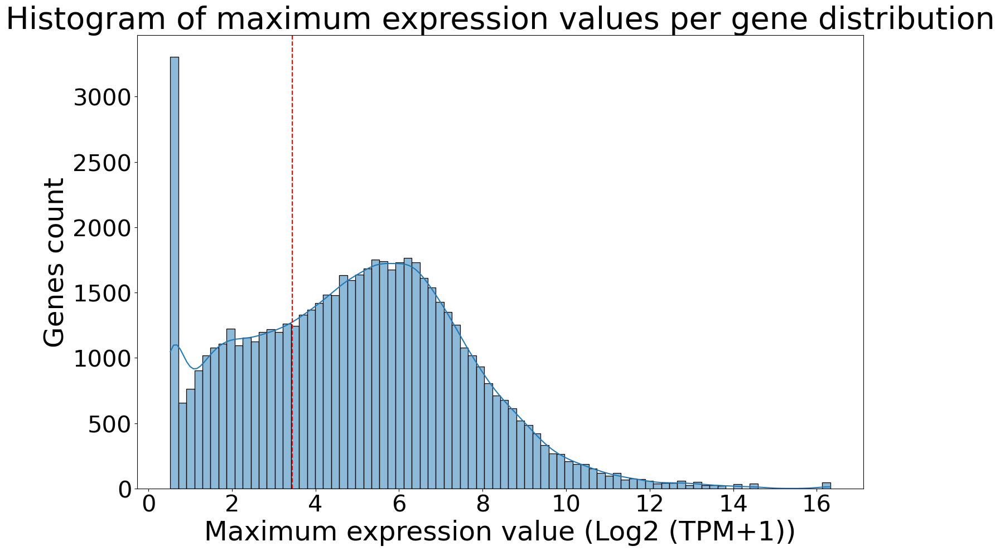

In [8]:
plt.figure(figsize = (15, 10))
sns.histplot(data = max_gene_exp, kde = True)
plt.axvline(x = 3.45, color = 'red', linestyle = '--')

plt.title('Histogram of maximum expression values per gene distribution', fontsize = 40)
plt.ylabel('Genes count', fontsize = 35)
plt.xlabel('Maximum expression value (Log2 (TPM+1))', fontsize = 35)
plt.yticks(fontsize = 30) 
plt.xticks(fontsize = 30) 
plt.tight_layout()


plt.savefig('/Volumes/TOSHIBA EXT/4t curs/Advanced Bioinformatics/Project/Python/Graphs/histogram_max_gene.png')

In [9]:
max_sel = max_gene_exp >= 3.45 
print(pd.Series(max_sel).value_counts())
max_subset = qnorm_df[max_sel]

True     42117
False    18543
Name: count, dtype: int64


Next, we will pick genes that we are going to use for the rest of our project by their CV and average of expression above samples, using hard thresholds. And we will store the filtered data frame of normalized data and its z-scores in two files.

In [10]:
average_expression = max_subset.sum(axis=1) / max_subset.shape[1]
cv_by_rows = max_subset.apply(lambda row: variation(row), axis=1)*100
gene_exp = pd.DataFrame({
    'Average': average_expression,
    'CV': cv_by_rows
})

value = (gene_exp['Average'] >= 2) & (gene_exp['CV'] >= 40) 
gene_exp['Threshold']= np.where( value == True , 'Higher', 'Lower')
print(pd.Series(gene_exp['Threshold']).value_counts())
gene_exp.head(5)

Threshold
Lower     39367
Higher     2750
Name: count, dtype: int64


,Average,CV,Threshold
gene_id,,,
ENSG00000000003.15,4.914053,19.470622,Lower
ENSG00000000005.6,0.354498,175.902717,Lower
ENSG00000000419.13,6.390922,9.355358,Lower
ENSG00000000457.14,3.334486,13.979415,Lower
ENSG00000000460.17,2.641021,30.416770,Lower


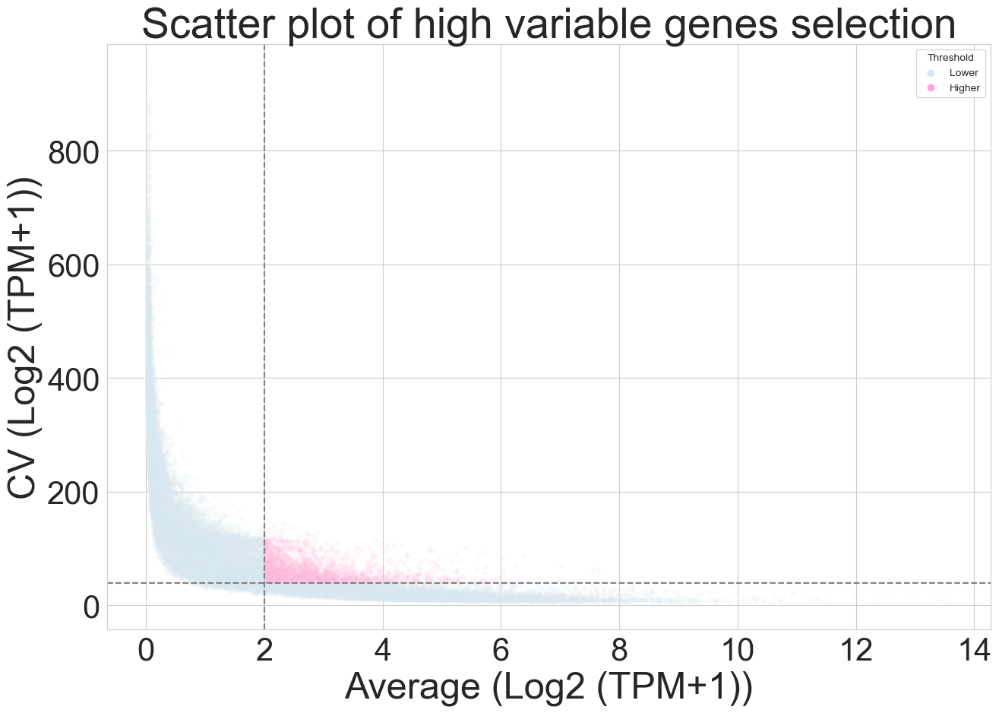

In [11]:
plt.figure(figsize = (15, 10))
sns.set_style('whitegrid')

sns.scatterplot(x = gene_exp['Average'], y = gene_exp['CV'], hue = gene_exp['Threshold'], palette={'#D4E7F0', '#FFA5D5'}, s=20, linewidth=0.5, alpha=.1)
plt.axvline(x = 2, color = 'grey', linestyle = '--')
plt.axhline(y = 40, color = 'grey', linestyle = '--')

plt.xlabel('Average (Log2 (TPM+1))', fontsize = 35) 
plt.ylabel('CV (Log2 (TPM+1))', fontsize = 35)
plt.title('Scatter plot of high variable genes selection', fontsize = 40)
plt.yticks(fontsize = 30) 
plt.xticks(fontsize = 30) 

plt.savefig('/Volumes/TOSHIBA EXT/4t curs/Advanced Bioinformatics/Project/Python/Graphs/scatterplot_selgenes.png')

In [12]:
subset = max_subset[gene_exp['Threshold'] == 'Higher']
subset.to_csv('/Volumes/TOSHIBA EXT/4t curs/Advanced Bioinformatics/Project/Python/filtered_data.csv')
subset

,77322072-2a7f-49e6-a9d1-c521c25acd70.rna_seq.augmented_star_gene_counts.tsv,6f6bf240-1ca4-47d0-9a77-17b0ce9b8ae7.rna_seq.augmented_star_gene_counts.tsv,59e8b7b7-5183-4655-aa5e-e4b5ba73eded.rna_seq.augmented_star_gene_counts.tsv,5418228b-cfd0-4580-87c6-3ebf6282ad73.rna_seq.augmented_star_gene_counts.tsv,c7fd0bf8-753e-45d6-b987-51ec7559f728.rna_seq.augmented_star_gene_counts.tsv,50c308c9-922a-4083-ae09-e5e4d8c437af.rna_seq.augmented_star_gene_counts.tsv,55071ef3-bf09-43a2-a54c-a9ec61a84615.rna_seq.augmented_star_gene_counts.tsv,7d9c7c34-76e0-4622-b5f7-60e12f6d4e07.rna_seq.augmented_star_gene_counts.tsv,32675d71-6f79-4b8f-ab7c-e2350b15875c.rna_seq.augmented_star_gene_counts.tsv,3d11905a-16eb-40b2-a36b-e37dca6359d3.rna_seq.augmented_star_gene_counts.tsv,...,4c87674d-dd05-490d-a584-84490509f4d4.rna_seq.augmented_star_gene_counts.tsv,5cfb768f-7b49-4a72-92c9-d7502f5ba5b8.rna_seq.augmented_star_gene_counts.tsv,03ef99c7-55b7-4770-9eac-2ee007aa78ca.rna_seq.augmented_star_gene_counts.tsv,3ab1dfbc-ab83-446e-b680-cd6aec12b177.rna_seq.augmented_star_gene_counts.tsv,029a2c3e-0fd1-4cb4-9021-3947d28ca28d.rna_seq.augmented_star_gene_counts.tsv,ed41fe8b-fe2e-4bf3-91e3-2cf50ddcbc78.rna_seq.augmented_star_gene_counts.tsv,b9a5766c-e155-423e-a075-10fb14fe87df.rna_seq.augmented_star_gene_counts.tsv,a462c0f9-23d3-428b-9b61-e42cb6a68af1.rna_seq.augmented_star_gene_counts.tsv,0d3cfbc0-4420-48ed-a459-2e18d2ece5b6.rna_seq.augmented_star_gene_counts.tsv,d43517e2-e447-42cc-93e1-cbc9669ef4f1.rna_seq.augmented_star_gene_counts.tsv
gene_id,,,,,,,,,,,,,,,,,,,,,
ENSG00000001626.16,1.304549,3.261332,3.722217,2.346879,4.177960,0.959881,3.200447,0.486827,1.704877,4.124809,...,1.534269,0.231615,0.813929,1.584977,3.721113,0.699277,3.488332,3.131197,2.857047,0.752304
ENSG00000002587.10,3.619455,3.627142,4.217653,2.136918,2.232058,3.251150,3.301567,4.491512,4.344818,3.319418,...,3.583543,1.737135,1.555058,2.960988,3.033466,3.351035,4.721262,4.242741,2.991749,2.591893
ENSG00000002726.21,6.065440,6.483734,1.117744,4.260121,2.761293,1.582193,1.809953,6.482846,5.514515,0.084273,...,1.193965,0.847151,1.257461,0.683391,2.679690,1.346708,1.720165,0.578644,4.215406,1.339194
ENSG00000003249.15,5.076464,4.160128,3.405024,5.016341,3.396452,6.363194,5.195496,4.990712,4.508740,0.660392,...,3.045930,3.257494,3.185546,3.844961,3.308179,2.994496,3.012456,3.526716,3.647706,3.057816
ENSG00000003989.18,3.598081,3.403381,4.250133,1.161847,4.730871,1.663668,6.072419,4.794502,3.826576,4.497061,...,1.904879,3.103330,3.975492,3.001684,3.408029,2.863342,3.597539,1.978948,3.924660,1.526541
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000287269.1,0.742058,0.417981,0.740324,0.058908,0.667061,0.832270,1.230802,0.608080,0.031902,4.475794,...,1.457099,1.215662,0.608494,1.589529,1.006190,2.665679,0.725499,1.848521,0.924038,1.253264
ENSG00000287458.1,0.518756,0.265235,0.061805,0.058908,1.124171,0.023241,0.508661,0.017896,1.110219,7.169273,...,0.112469,0.841516,0.325732,0.641527,0.043134,0.360423,0.049553,0.034596,0.386308,0.078024
ENSG00000287580.1,1.513435,1.862469,2.629411,1.900164,0.924038,2.312679,1.648187,1.494240,1.587456,4.621370,...,1.565371,2.158437,1.247983,1.002621,0.950696,1.013464,0.049553,2.734163,1.857403,2.180723


In [13]:
z_scores = zscore(subset, axis=1, ddof=1)
z_scores.to_csv('/Volumes/TOSHIBA EXT/4t curs/Advanced Bioinformatics/Project/Python/filtered_zdata.csv')
z_scores

,77322072-2a7f-49e6-a9d1-c521c25acd70.rna_seq.augmented_star_gene_counts.tsv,6f6bf240-1ca4-47d0-9a77-17b0ce9b8ae7.rna_seq.augmented_star_gene_counts.tsv,59e8b7b7-5183-4655-aa5e-e4b5ba73eded.rna_seq.augmented_star_gene_counts.tsv,5418228b-cfd0-4580-87c6-3ebf6282ad73.rna_seq.augmented_star_gene_counts.tsv,c7fd0bf8-753e-45d6-b987-51ec7559f728.rna_seq.augmented_star_gene_counts.tsv,50c308c9-922a-4083-ae09-e5e4d8c437af.rna_seq.augmented_star_gene_counts.tsv,55071ef3-bf09-43a2-a54c-a9ec61a84615.rna_seq.augmented_star_gene_counts.tsv,7d9c7c34-76e0-4622-b5f7-60e12f6d4e07.rna_seq.augmented_star_gene_counts.tsv,32675d71-6f79-4b8f-ab7c-e2350b15875c.rna_seq.augmented_star_gene_counts.tsv,3d11905a-16eb-40b2-a36b-e37dca6359d3.rna_seq.augmented_star_gene_counts.tsv,...,4c87674d-dd05-490d-a584-84490509f4d4.rna_seq.augmented_star_gene_counts.tsv,5cfb768f-7b49-4a72-92c9-d7502f5ba5b8.rna_seq.augmented_star_gene_counts.tsv,03ef99c7-55b7-4770-9eac-2ee007aa78ca.rna_seq.augmented_star_gene_counts.tsv,3ab1dfbc-ab83-446e-b680-cd6aec12b177.rna_seq.augmented_star_gene_counts.tsv,029a2c3e-0fd1-4cb4-9021-3947d28ca28d.rna_seq.augmented_star_gene_counts.tsv,ed41fe8b-fe2e-4bf3-91e3-2cf50ddcbc78.rna_seq.augmented_star_gene_counts.tsv,b9a5766c-e155-423e-a075-10fb14fe87df.rna_seq.augmented_star_gene_counts.tsv,a462c0f9-23d3-428b-9b61-e42cb6a68af1.rna_seq.augmented_star_gene_counts.tsv,0d3cfbc0-4420-48ed-a459-2e18d2ece5b6.rna_seq.augmented_star_gene_counts.tsv,d43517e2-e447-42cc-93e1-cbc9669ef4f1.rna_seq.augmented_star_gene_counts.tsv
gene_id,,,,,,,,,,,,,,,,,,,,,
ENSG00000001626.16,-0.846844,0.454121,0.760540,-0.153852,1.063540,-1.075996,0.413641,-1.390506,-0.580686,1.028202,...,-0.694115,-1.560183,-1.173032,-0.660402,0.759806,-1.249258,0.605041,0.367601,0.185332,-1.214004
ENSG00000002587.10,0.838805,0.845227,1.338536,-0.399694,-0.320215,0.531127,0.573244,1.567315,1.444768,0.588157,...,0.808805,-0.733669,-0.885775,0.288727,0.349275,0.614570,1.759246,1.359494,0.314425,-0.019611
ENSG00000002726.21,2.069025,2.289553,-0.539441,1.117246,0.327052,-0.294580,-0.174503,2.289085,1.778573,-1.084296,...,-0.499257,-0.682100,-0.465781,-0.768436,0.284029,-0.418729,-0.221840,-0.823659,1.093672,-0.422691
ENSG00000003249.15,1.341025,0.738791,0.242522,1.301511,0.236888,2.186689,1.419255,1.284667,0.967906,-1.561305,...,0.006518,0.145562,0.098277,0.531657,0.178873,-0.027285,-0.015482,0.322500,0.402017,0.014330
ENSG00000003989.18,-0.283516,-0.393480,0.084754,-1.659468,0.356269,-1.376047,1.113957,0.392207,-0.154465,0.224216,...,-1.239814,-0.562945,-0.070360,-0.620353,-0.390855,-0.698487,-0.283822,-1.197981,-0.099068,-1.453495
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000287269.1,-0.805478,-1.010428,-0.806574,-1.237511,-0.852907,-0.748426,-0.496389,-0.890207,-1.254590,1.555788,...,-0.353276,-0.505964,-0.889946,-0.269526,-0.638437,0.411046,-0.815950,-0.105736,-0.690391,-0.482184
ENSG00000287458.1,-0.685432,-0.793698,-0.880572,-0.881809,-0.426890,-0.897041,-0.689743,-0.899323,-0.432849,2.154660,...,-0.858936,-0.547598,-0.767863,-0.633002,-0.888545,-0.753048,-0.885804,-0.892192,-0.741993,-0.873646
ENSG00000287580.1,-0.584609,-0.228665,0.553461,-0.190224,-1.185675,0.230459,-0.447189,-0.604184,-0.509122,2.584859,...,-0.531644,0.073163,-0.855316,-1.105536,-1.158489,-1.094479,-2.077473,0.660288,-0.233831,0.095890


# Heatmaps

To visualize all the data manipulation done on this notebook, we will plot heatmaps of: a set of random genes around samples after normalization; all selected genes around samples; all selected genes z-socres around samples and finally a clustermap with these.
Going through the created plots we can se that they go from less informative to more informative and interpretable. In the clustermap, we can appreciate different gene expression patterns around samples. Looking further, we can expect around 3 to 6 clusters of samples when performing the clustering in the next notebooks.

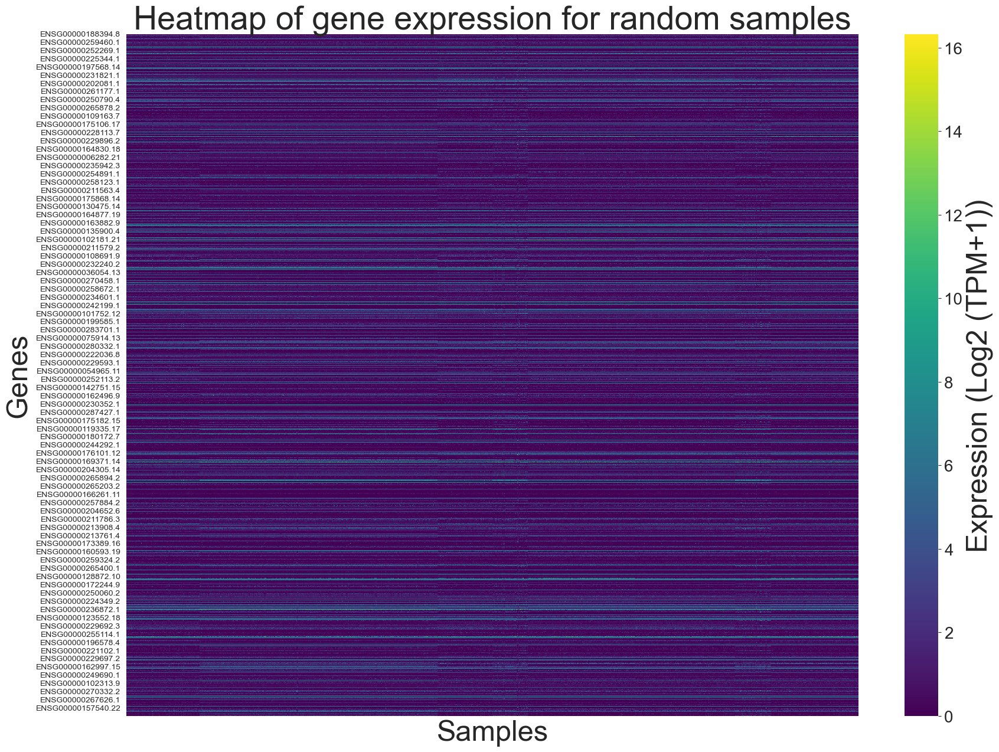

In [14]:
random_qnorm_df = qnorm_df.sample(n=3566)
plt.figure(figsize = (20, 15)) 

heatmap = sns.heatmap(random_qnorm_df, cmap = 'viridis', xticklabels = False)

plt.title('Heatmap of gene expression for random samples', fontsize = 40)
plt.xlabel('Samples', fontsize = 35)
plt.ylabel('Genes', fontsize = 35)

cbar = heatmap.collections[0].colorbar
cbar.ax.set_ylabel('Expression (Log2 (TPM+1))', fontsize = 35)
cbar.ax.tick_params(labelsize = 20)

plt.savefig('/Volumes/TOSHIBA EXT/4t curs/Advanced Bioinformatics/Project/Python/Graphs/random_heatmap.png')

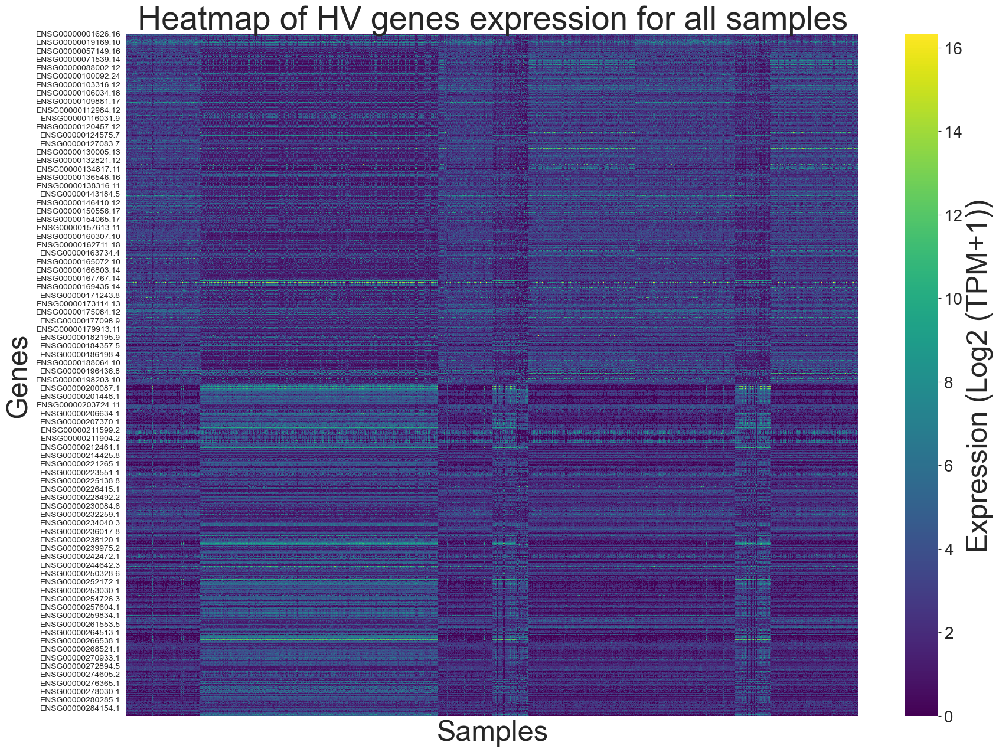

In [15]:
plt.figure(figsize = (20, 15)) 

heatmap = sns.heatmap(subset, cmap = 'viridis', xticklabels = False)

plt.title('Heatmap of HV genes expression for all samples', fontsize = 40)
plt.xlabel('Samples', fontsize = 35)
plt.ylabel('Genes', fontsize = 35)

cbar = heatmap.collections[0].colorbar
cbar.ax.set_ylabel('Expression (Log2 (TPM+1))', fontsize = 35)
cbar.ax.tick_params(labelsize = 20)

plt.savefig('/Volumes/TOSHIBA EXT/4t curs/Advanced Bioinformatics/Project/Python/Graphs/sel_norm_heatmap.png')

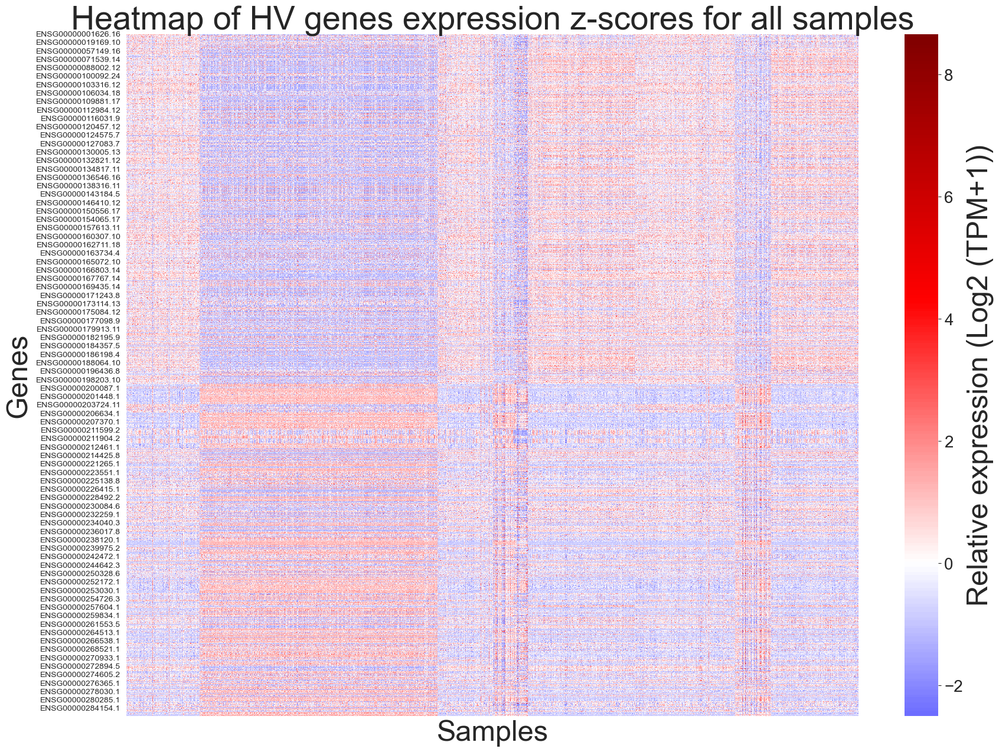

In [16]:
plt.figure(figsize = (20, 15)) 

heatmap = sns.heatmap(z_scores, cmap = 'seismic', xticklabels = False, center = 0)

plt.title('Heatmap of HV genes expression z-scores for all samples', fontsize = 40)
plt.xlabel('Samples', fontsize = 35)
plt.ylabel('Genes', fontsize = 35)


cbar = heatmap.collections[0].colorbar
cbar.ax.set_ylabel('Relative expression (Log2 (TPM+1))', fontsize = 35)
cbar.ax.tick_params(labelsize = 20)

plt.savefig('/Volumes/TOSHIBA EXT/4t curs/Advanced Bioinformatics/Project/Python/Graphs/sel_norm_zheatmap.png')

/Users/claudiavicentecomorera/anaconda3/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/claudiavicentecomorera/anaconda3/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


<Figure size 2000x1500 with 0 Axes>

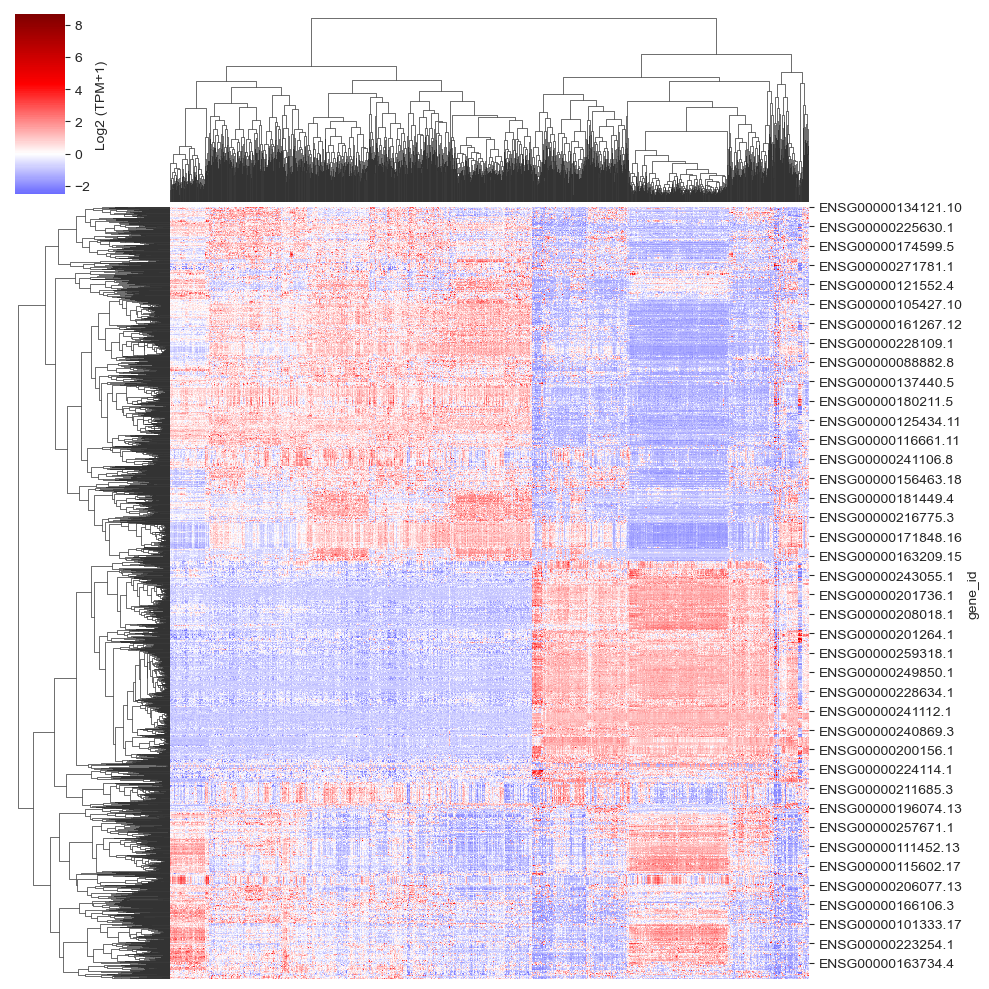

In [17]:
plt.figure(figsize = (20, 15))

sns.clustermap(z_scores, cmap = 'seismic', xticklabels = False, center = 0, 
                method = 'complete', metric = 'cosine', cbar_kws = {'label':'Log2 (TPM+1)'})

plt.savefig('/Volumes/TOSHIBA EXT/4t curs/Advanced Bioinformatics/Project/Python/Graphs/norm_zclustermap.png')